# Scientific Programming and Dynamical Modelling in Julia
#### Winter Semester 23/24, TUM
---
## Exercise 3: Stability and Bifurcations

In [1]:
import Pkg; Pkg.activate("env_ex3.jl")
using Plots, Plots.PlotMeasures, Statistics, DifferentialEquations, BenchmarkTools

  Activating project at `c:\Users\colin\OneDrive-TUM\Code\Julia\MMDS_Julia\env_ex3.jl`


## Stability of a Double Well

Explore the stability of the system $$\frac{dx}{dt} = x - x^3.$$ What are the fixed points of the system and what's their stability? Which intervals of initial conditions lead to which of the stable fixed points?

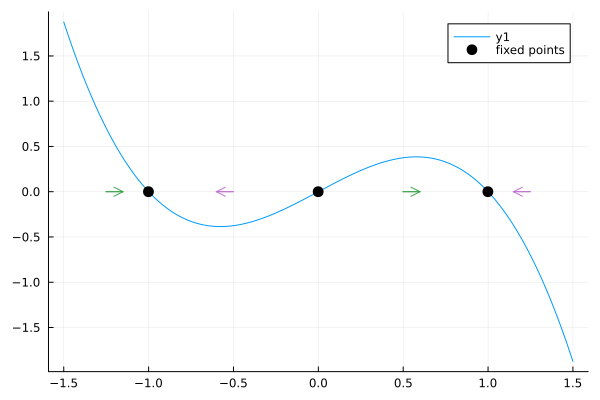

In [2]:
x = -1.5:0.001:1.5
y = x - x.^3
plt = plot(x, y)

# find fixed points by sign change (and remove duplicates)
idx_fixed = findall((y[1:end-1] .* y[2:end]) .<= 0)
idxs_double = findall(idx_fixed[2:end] - idx_fixed[1:end-1] .< 2)
deleteat!(idx_fixed, idxs_double .+ 1)
scatter!(x[idx_fixed], [0, 0, 0], color="black", markersize=6, label="fixed points")

# find midpoints of intervals between fixed points
indices = [1, idx_fixed..., length(x)]
mids = round.(Int, (indices[2:end] + indices[1:end-1])/2)
x_pos = x[mids[y[mids] .> 0]]
x_neg = x[mids[y[mids] .< 0]]

quiver!(x_pos, zeros(size(x_pos)), quiver=([.1],[0]))
quiver!(x_neg, zeros(size(x_neg)), quiver=([-.1],[0]))


## Lotka-Volterra Competition System
$\phantom{space}\frac{dR}{dt} = R(3 - R - 2S)\\
\phantom{space}\\
\phantom{space}\frac{dS}{dt} = S(2 - R - S)$

First, we define the *rhs* of the differential equation:

In [3]:
function lotka_volterra_competition!(du, u, p, t)
    R, S = u

    du[1] = R * (3 - R - 2*S)
    du[2] = S * (2 - R - S)

    return nothing
end

lotka_volterra_competition! (generic function with 1 method)

Using **DifferentialEquations.jl**, we can solve the ODE:

In [4]:
tspan = [0.0, 20.0]
u0 = [10.0, 5.0]
prob = ODEProblem(lotka_volterra_competition!, u0, tspan)
sol = solve(prob);

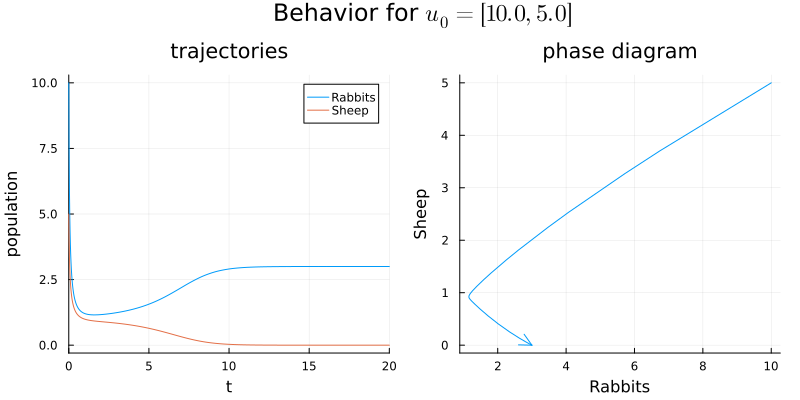

In [5]:
plt = plot(layout=(1,2), size=(800, 400), suptitle="Behavior for \$u_0=$u0\$", plot_titlevspan=0.1, margin=3mm)
plot!(sol, title="trajectories", xlabel = "t", ylabel = "population", label = ["Rabbits" "Sheep"], subplot=1)
u = Array(sol)
plot!(u[1, :], u[2, :], title="phase diagram", xlabel="Rabbits", ylabel="Sheep", legend=false, arrow=true, subplot=2)

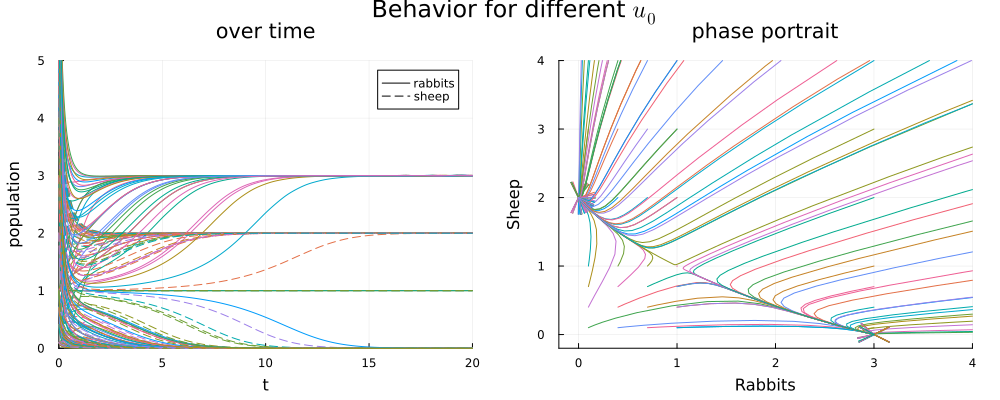

In [6]:
u0_1 = [0.1:0.3:1..., 1:2:10...]
u0_2 = [0.1:0.3:1..., 2:7...]
tspan = (0.0, 20.0)

plt = plot(
    4, linestyle=[:solid :solid :dash :dash], color="black",
    label=[["rabbits" nothing] ["sheep" nothing]], layout=(1,2), suptitle="Behavior for different \$u_0\$",
    size=(1000, 400), show=true, left_margin=5mm, margin = 5mm
    )
for u1_ in u0_1, u2_ in u0_2
    prob = ODEProblem(lotka_volterra_competition!, [u1_, u2_], tspan)
    sol = solve(prob)

    plot!(
        sol, xlabel = "t", linestyle=[:solid :dash], subplot=1, ylim=[0, 5],
        ylabel = "population", title="over time", labels=[nothing nothing]
        )
    u = Array(sol)
    plot!(
        u[1, :], u[2, :], arrow=true, legend=false, subplot=2,
        title="phase portrait", xlabel="Rabbits", ylabel="Sheep", xlim=[-.2, 4], ylim= [-.2, 4]
        )
end
plt

**Observations:**
- two stable fixed points (sinks) at $(3, 0), (0, 2)$
- one unstable fixed point (saddle) at $(1, 1)$
- one unstable fixed point at $(0, 0)$

## Lotka-Volterra Predator-Prey Model
A simple predator-prey model, with $H$ representing the hares and $F$ the foxes.

$ \phantom{space}\frac{dH}{dt} = \alpha H - \beta H F \\
   \phantom{space} \\
   \phantom{space}\frac{dF}{dt} = -\gamma F + \delta H F $
   

In [7]:
function lotka_volterra!(du, u, p, t)
    H, F = u
    alpha, beta, gamma, delta = p

    du[1] = alpha*H - beta*H*F
    du[2] = -gamma*F + delta*H*F

    return nothing
end

lotka_volterra! (generic function with 1 method)

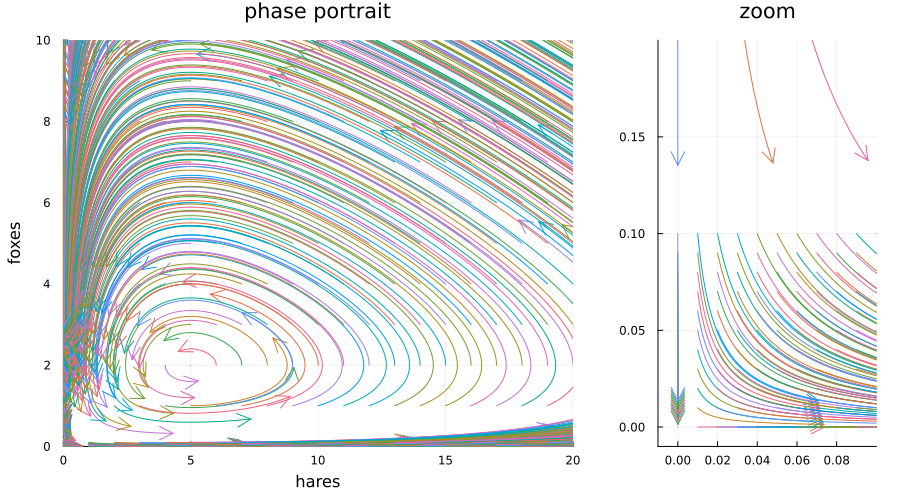

In [8]:
u0_1 = [0:0.01:.1..., 1:20...]
u0_2 = [0:0.01:.1..., 1:10...]
p = [1., 0.5, 1., 0.2]
tspan = [0, 2];
# tspan = [0, 10];

l = @layout [a{0.7w} b{0.3w}]
plt = plot(2, title=["phase portrait" "zoom"], xlims = [0,20.0], ylims = [0,10.0], layout=l, size=(900, 500), margin=4mm)
for u1_ in u0_1, u2_ in u0_2
    prob = ODEProblem(lotka_volterra!, [u1_, u2_], tspan, p)
    sol = solve(prob, saveat = 0.01)
    u = Array(sol)
    plot!(u[1, :], u[2, :], linewidth=1, arrow=true, legend=false, xlabel="hares", ylabel="foxes", subplot=1)
    plot!(u[1, :], u[2, :], linewidth=1, arrow=true, legend=false, subplot=2, xlim=[-.01, .1], ylim=[-.01, .2])
end
plt


**Observations:**
- one fixed point at $(5, 2)$
- one saddle point at $(0, 0)$